## Packages

In [1]:
import os.path as osp
from pathlib import Path
from time import time
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

import numpy as np
import pandas as pd
import librosa
import math

from IPython.display import Audio
import librosa.display

## Arguments & User Defined Functions

In [2]:
min_words = 40
wavs_dir = "C:/Users/yagne/Downloads/mp3s/"
target_sr = 16000
transcripts_path = "../outputs/all_transcripts_v2.csv"
transcripts = pd.read_csv(transcripts_path)
print(transcripts.shape)

(111714, 9)


In [3]:
def play_audio(signal, rate):
    return Audio(data=signal, rate=rate)

## Collect All Transcripts

In [4]:
wavs = [path for path in Path(wavs_dir).rglob("*.mp3")]
print("WAV Files:", len(wavs))

WAV Files: 488


In [5]:
data = (
    transcripts.loc[
        (transcripts["word_count"] >= min_words)
        & (transcripts["speaker_role"] == "scotus_justice")
    ]
    .copy()
    .reset_index(drop=True)
)

print(data.shape)
data["start_idx"] = np.floor(data["start"] * target_sr).astype(int)
data["end_idx"] = np.ceil(data["end"] * target_sr).astype(int)

# data.to_csv("../outputs/data_transcripts_v2.csv", index=False)

(17138, 9)


In [6]:
# st = time()
# all_data = []
# for i, w in enumerate(wavs):
#     wav_file, wav_sr = librosa.load(w, sr=librosa.core.get_samplerate(w))
#     df = pd.read_json(osp.join(w.parent, w.name.replace(".wav", ".json")))
#     df["file"] = w.name
#     df["line"] = df.index

#     # TODO: Add Sample Rate, Channels
#     df["sample_rate"] = wav_sr
#     df["channels"] = len(wav_file.shape)
#     df["duration"] = df["end"] - df["start"]
#     df["start_idx"] = np.floor(df["start"] * wav_sr).astype(int)
#     df["end_idx"] = np.ceil(df["end"] * wav_sr).astype(int)
#     df["word_count"] = df["text"].apply(lambda x: len(x.split(" ")))

#     data = (
#         df.loc[(df["word_count"] >= 40) & (df["speaker_role"] == "scotus_justice")]
#         .copy()
#         .reset_index(drop=True)
#     )
#     data = data[
#         [
#             "file",
#             "line",
#             "speaker",
#             "start",
#             "end",
#             "duration",
#             "sample_rate",
#             "channels",
#             "start_idx",
#             "end_idx",
#             "word_count",
#             "text",
#         ]
#     ]

#     all_data.append(data)

# all_transcripts = pd.concat(all_data)
# print("\n Record Info:")
# print(all_transcripts.shape)

# print(f"{round(time() - st, 2)}s")

In [7]:
data.loc[(data["file"] == "19-715") & (data["line"] == 180)]

,file,line,start,end,speaker,speaker_role,word_count,duration,text,start_idx,end_idx
15890,19-715,180,3993.0,4011.0,Elena_Kagan,scotus_justice,53,18.0,"Good morning, Mr. Letter. In -- in -- in talki...",63888000,64176000


In [8]:
a_sample = data.sample(n=5)
a_sample

,file,line,start,end,speaker,speaker_role,word_count,duration,text,start_idx,end_idx
449,12-1184,6,169.121,183.194,Anthony_M_Kennedy,scotus_justice,41,14.073,"Because if we remand to the District Court, th...",2705936,2931104
1500,12-7822,168,3434.469,3455.732,John_G_Roberts_Jr,scotus_justice,69,21.263,"Counsel, I don't understand how you can say it...",54951504,55291712
8449,16-1435,99,1027.160,1058.160,Sonia_Sotomayor,scotus_justice,63,31.000,So there's always line-drawing. Whether you ca...,16434560,16930560
7229,15-6092,48,535.260,600.440,Elena_Kagan,scotus_justice,179,65.180,Isn't there also something that Descamps says ...,8564160,9607040
3215,13-461,64,1317.324,1344.806,Stephen_G_Breyer,scotus_justice,91,27.482,Of course there is. And that separate exclusiv...,21077184,21516896


## Listen to Audio

In [9]:
sample_1 = dict(data.iloc[827])
wav_file, wav_sr = librosa.load(
    path=osp.join(wavs_dir, f"{sample_1['file']}.mp3"),
    sr=librosa.core.get_samplerate(osp.join(wavs_dir, f"{sample_1['file']}.mp3")),
)

print("Speaker:", sample_1["speaker"])
print("File - Line", sample_1["file"], "-", sample_1["line"])
print("Duration:", sample_1["duration"])
print("Text:", sample_1["text"])
start_idx = math.floor(wav_sr*sample_1["start"])
end_idx = math.ceil(wav_sr*sample_1["end"])
clip = wav_file[start_idx:end_idx]
play_audio(clip, wav_sr)

C:\Users\yagne\.conda\envs\grandstanding\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Speaker: Anthony_M_Kennedy
File - Line 12-315 - 21
Duration: 11.308
Text: What -- what position -- although they'll tell us in a minute -- does Respondent take on that issue that a determination by the jury suffices? As you understand their brief. They can talk for themselves in a few minutes.


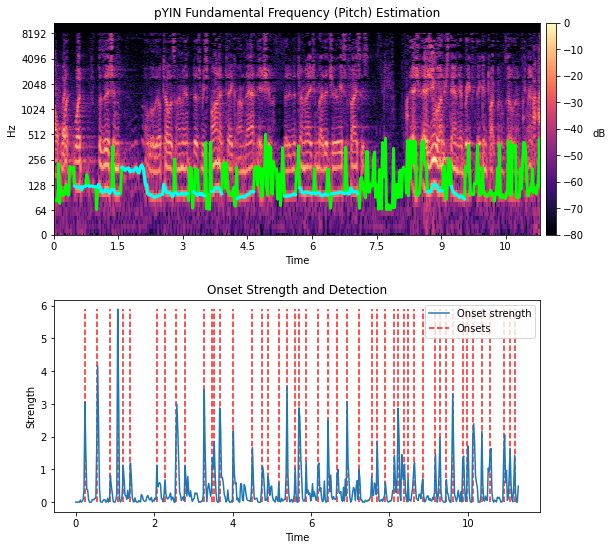

In [13]:
# Pitch
f0, voiced_flag, voiced_probs = librosa.pyin(clip, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C5'), sr=wav_sr)
times = librosa.times_like(f0)
D = librosa.amplitude_to_db(np.abs(librosa.stft(clip)), ref=np.max)


yin_f0 = librosa.yin(clip, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C5'), sr=wav_sr)

# Onset
o_env = librosa.onset.onset_strength(clip, sr=wav_sr, max_size=10)
times = librosa.frames_to_time(np.arange(len(o_env)), sr=wav_sr)
onset_frames = librosa.onset.onset_detect(onset_envelope=o_env, sr=wav_sr)


# Plot
D = np.abs(librosa.stft(clip))


fig = plt.figure(figsize=(9,9))
ax1 = plt.subplot(111)
im1 = librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),x_axis='time', y_axis='log', ax=ax1, label='_nolegend_')
ax1.set(title='pYIN Fundamental Frequency (Pitch) Estimation')
yin_f0_plot, = ax1.plot(times, yin_f0, color="lime", label="f0 (Pitch)", linewidth=3)

f0_plot, = ax1.plot(times, f0, color="cyan", label="f0 (Pitch)", linewidth=3)

# ax1.legend(handles=[f0_plot])

divider = make_axes_locatable(ax1)
ax2 = divider.append_axes("bottom", size="100%", pad=0.9)
cax = divider.append_axes("right", size="2%", pad=0.08)
cb = plt.colorbar(im1, ax=ax1, cax=cax )
cax.get_yaxis().labelpad=15
cax.set_ylabel('dB', rotation=0)

ax2.set(xlabel="Time", ylabel="Strength",title="Onset Strength and Detection")
ax2.plot(times, o_env, label='Onset strength')
ax2.vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9, linestyle='--', label='Onsets')
ax2.legend()

In [ ]:
yin_f0_plot, = ax1.plot(times, yin_f0, color="lime", label="f0 (Pitch)", linewidth=3)
f0_plot, = ax1.plot(times, f0, color="cyan", label="f0 (Pitch)", linewidth=3)

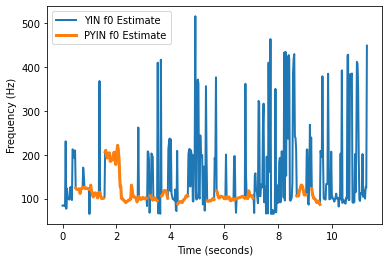

In [26]:
plt.plot(times, yin_f0, label="YIN f0 Estimate", linewidth=2)
plt.plot(times, f0, label="PYIN f0 Estimate", linewidth=3)
plt.xlabel("Time (seconds)")
plt.ylabel("Frequency (Hz)")
plt.legend()

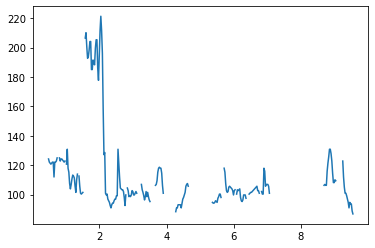

In [15]:
# Speaker: Elena_Kagan
# File - Line 19-715 - 180

In [104]:
sample_1 = dict(a_sample.iloc[1])
wav_file, wav_sr = librosa.load(
    path=osp.join(wavs_dir, f"{sample_1['file']}.mp3"),
    sr=librosa.core.get_samplerate(osp.join(wavs_dir, f"{sample_1['file']}.mp3")),
)

print("Speaker:", sample_1["speaker"])
print("File - Line", sample_1["file"], "-", sample_1["line"])
print("Duration:", sample_1["duration"])
print("Text:", sample_1["text"])
start_idx = math.floor(wav_sr*sample_1["start"])
end_idx = math.ceil(wav_sr*sample_1["end"])
clip = wav_file[start_idx:end_idx]
play_audio(clip, wav_sr)

C:\Users\yagne\.conda\envs\grandstanding\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Speaker: Sonia_Sotomayor
File - Line 16-111 - 531
Duration: 52.08
Text: Counsel, the problem is that America's reaction to mixed marriages and to race didn't change on its own. It changed because we had public accommodation laws that forced people to do things that many claimed were against their expressive rights and against their religious rights. It's not denigrating someone by saying, as I mentioned earlier, to say: If you choose to participate in our community in a public way, your choice, you can choose to sell cakes or not. You can choose to sell cupcakes or not, whatever it is you choose to sell, you have to sell it to everyone who knocks on your door, if you open your door to everyone.


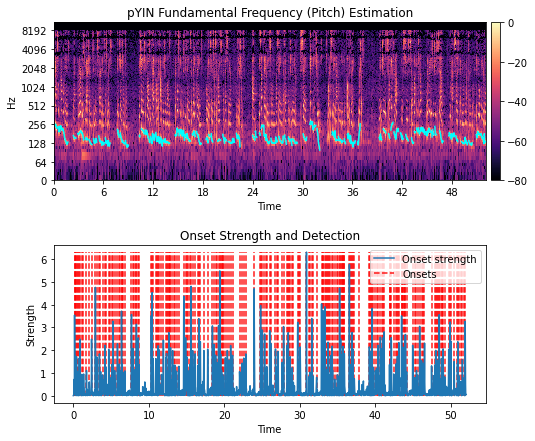

In [105]:
# Pitch
f0, voiced_flag, voiced_probs = librosa.pyin(clip, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C5'))
times = librosa.times_like(f0)
D = librosa.amplitude_to_db(np.abs(librosa.stft(clip)), ref=np.max)

# Onset
o_env = librosa.onset.onset_strength(clip, sr=wav_sr, max_size=10)
times = librosa.frames_to_time(np.arange(len(o_env)), sr=wav_sr)
onset_frames = librosa.onset.onset_detect(onset_envelope=o_env, sr=wav_sr)


# Plot
D = np.abs(librosa.stft(clip))


fig = plt.figure(figsize=(8,7))
ax1 = plt.subplot(111)
im1 = librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),x_axis='time', y_axis='log', ax=ax1, label='_nolegend_')
ax1.set(title='pYIN Fundamental Frequency (Pitch) Estimation')
f0_plot, = ax1.plot(times, f0, color="cyan", label="f0 (Pitch)", linewidth=3)
# ax1.legend(handles=[f0_plot])

divider = make_axes_locatable(ax1)
ax2 = divider.append_axes("bottom", size="100%", pad=0.9)
cax = divider.append_axes("right", size="2%", pad=0.08)
cb = plt.colorbar(im1, ax=ax1, cax=cax )

ax2.set(xlabel="Time", ylabel="Strength",title="Onset Strength and Detection")
ax2.plot(times, o_env, label='Onset strength')
ax2.vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9, linestyle='--', label='Onsets')
ax2.legend()

In [107]:
sample_1 = dict(a_sample.iloc[2])
wav_file, wav_sr = librosa.load(
    path=osp.join(wavs_dir, f"{sample_1['file']}.mp3"),
    sr=librosa.core.get_samplerate(osp.join(wavs_dir, f"{sample_1['file']}.mp3")),
)

print("Speaker:", sample_1["speaker"])
print("File - Line", sample_1["file"], "-", sample_1["line"])
print("Duration:", sample_1["duration"])
print("Text:", sample_1["text"])
start_idx = math.floor(wav_sr*sample_1["start"])
end_idx = math.ceil(wav_sr*sample_1["end"])
clip = wav_file[start_idx:end_idx]
play_audio(clip, wav_sr)

C:\Users\yagne\.conda\envs\grandstanding\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Speaker: Clarence_Thomas
File - Line 19-1257 - 21
Duration: 32.865
Text: Thank you, Mr. Chief Justice. Mr. Carvin, I -- I under -- your -- I understand your race neutrality argument, and normally you see that in -- to come in -- in -- in the context of a non-discrimination statute or Fourteenth Amendment that under -- that really requires equal treatment. How does that race neutrality approach fit within the language of the Voting Rights Act, though, that doesn't speak in -- in those terms?


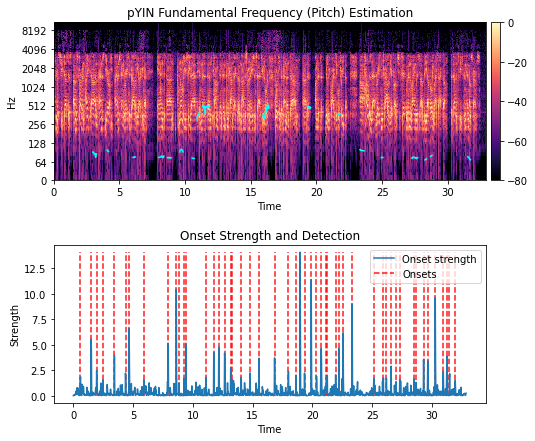

In [108]:
# Pitch
f0, voiced_flag, voiced_probs = librosa.pyin(clip, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C5'))
times = librosa.times_like(f0)
D = librosa.amplitude_to_db(np.abs(librosa.stft(clip)), ref=np.max)

# Onset
o_env = librosa.onset.onset_strength(clip, sr=wav_sr, max_size=10)
times = librosa.frames_to_time(np.arange(len(o_env)), sr=wav_sr)
onset_frames = librosa.onset.onset_detect(onset_envelope=o_env, sr=wav_sr)


# Plot
D = np.abs(librosa.stft(clip))


fig = plt.figure(figsize=(8,7))
ax1 = plt.subplot(111)
im1 = librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),x_axis='time', y_axis='log', ax=ax1, label='_nolegend_')
ax1.set(title='pYIN Fundamental Frequency (Pitch) Estimation')
f0_plot, = ax1.plot(times, f0, color="cyan", label="f0 (Pitch)", linewidth=3)
# ax1.legend(handles=[f0_plot])

divider = make_axes_locatable(ax1)
ax2 = divider.append_axes("bottom", size="100%", pad=0.9)
cax = divider.append_axes("right", size="2%", pad=0.08)
cb = plt.colorbar(im1, ax=ax1, cax=cax )

ax2.set(xlabel="Time", ylabel="Strength",title="Onset Strength and Detection")
ax2.plot(times, o_env, label='Onset strength')
ax2.vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9, linestyle='--', label='Onsets')
ax2.legend()

In [117]:
sample_1 = dict(a_sample.iloc[3])
wav_file, wav_sr = librosa.load(
    path=osp.join(wavs_dir, f"{sample_1['file']}.mp3"),
    sr=librosa.core.get_samplerate(osp.join(wavs_dir, f"{sample_1['file']}.mp3")),
)

print("Speaker:", sample_1["speaker"])
print("File - Line", sample_1["file"], "-", sample_1["line"])
print("Duration:", sample_1["duration"])
print("Text:", sample_1["text"])
start_idx = math.floor(wav_sr*sample_1["start"])
end_idx = math.ceil(wav_sr*sample_1["end"])
clip = wav_file[start_idx:end_idx]
play_audio(clip, wav_sr)

C:\Users\yagne\.conda\envs\grandstanding\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Speaker: Ruth_Bader_Ginsburg
File - Line 13-1074 - 4
Duration: 40.375
Text: That's the Court. Congress did not say jurisdiction. And I -- I'm sure you are well aware that this Court, for some time now, has been explaining that “ jurisdiction ” is a word of many meanings, too many meanings, and has tried to distinguish jurisdiction, meaning subject matter or personal, from the rules, once a case fits jurisdiction, how it will be processed in the Court. And it seems to me a time limitation, even a very stringent time limitation, is not jurisdictional.


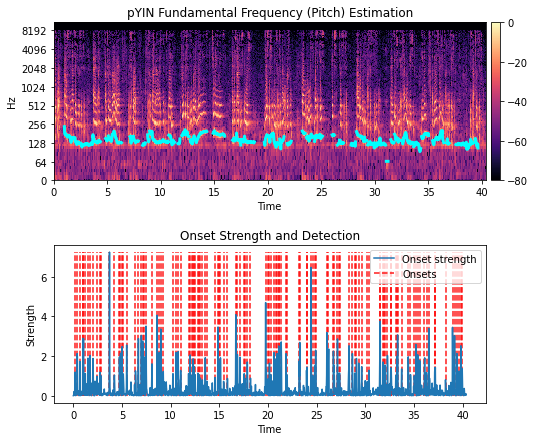

In [118]:
# Pitch
f0, voiced_flag, voiced_probs = librosa.pyin(clip, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C5'))
times = librosa.times_like(f0)
D = librosa.amplitude_to_db(np.abs(librosa.stft(clip)), ref=np.max)

# Onset
o_env = librosa.onset.onset_strength(clip, sr=wav_sr, max_size=10)
times = librosa.frames_to_time(np.arange(len(o_env)), sr=wav_sr)
onset_frames = librosa.onset.onset_detect(onset_envelope=o_env, sr=wav_sr)


# Plot
D = np.abs(librosa.stft(clip))


fig = plt.figure(figsize=(8,7))
ax1 = plt.subplot(111)
im1 = librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),x_axis='time', y_axis='log', ax=ax1, label='_nolegend_')
ax1.set(title='pYIN Fundamental Frequency (Pitch) Estimation')
f0_plot, = ax1.plot(times, f0, color="cyan", label="f0 (Pitch)", linewidth=3)
# ax1.legend(handles=[f0_plot])

divider = make_axes_locatable(ax1)
ax2 = divider.append_axes("bottom", size="100%", pad=0.9)
cax = divider.append_axes("right", size="2%", pad=0.08)
cb = plt.colorbar(im1, ax=ax1, cax=cax )

ax2.set(xlabel="Time", ylabel="Strength",title="Onset Strength and Detection")
ax2.plot(times, o_env, label='Onset strength')
ax2.vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9, linestyle='--', label='Onsets')
ax2.legend()

In [113]:
sample_1 = dict(a_sample.iloc[4])
wav_file, wav_sr = librosa.load(
    path=osp.join(wavs_dir, f"{sample_1['file']}.mp3"),
    sr=librosa.core.get_samplerate(osp.join(wavs_dir, f"{sample_1['file']}.mp3")),
)

print("Speaker:", sample_1["speaker"])
print("File - Line", sample_1["file"], "-", sample_1["line"])
print("Duration:", sample_1["duration"])
print("Text:", sample_1["text"])
start_idx = math.floor(wav_sr*sample_1["start"])
end_idx = math.ceil(wav_sr*sample_1["end"])
clip = wav_file[start_idx:end_idx]
play_audio(clip, wav_sr)

C:\Users\yagne\.conda\envs\grandstanding\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Speaker: Stephen_G_Breyer
File - Line 14-520 - 168
Duration: 12.05
Text: But I mean, you see where I'm having the problem, that Jones, who came in, he fills out the papers and he signs the signature, he puts in all the things and he says, please, please, please give that credit to Smith.


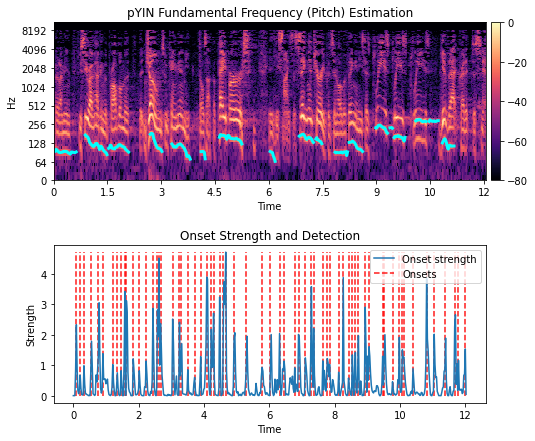

In [115]:
# Pitch
f0, voiced_flag, voiced_probs = librosa.pyin(clip, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C5'))
times = librosa.times_like(f0)
D = librosa.amplitude_to_db(np.abs(librosa.stft(clip)), ref=np.max)

# Onset
o_env = librosa.onset.onset_strength(clip, sr=wav_sr, max_size=10)
times = librosa.frames_to_time(np.arange(len(o_env)), sr=wav_sr)
onset_frames = librosa.onset.onset_detect(onset_envelope=o_env, sr=wav_sr)


# Plot
D = np.abs(librosa.stft(clip))


fig = plt.figure(figsize=(8,7))
ax1 = plt.subplot(111)
im1 = librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),x_axis='time', y_axis='log', ax=ax1, label='_nolegend_')
ax1.set(title='pYIN Fundamental Frequency (Pitch) Estimation')
f0_plot, = ax1.plot(times, f0, color="cyan", label="f0 (Pitch)", linewidth=3)
# ax1.legend(handles=[f0_plot])

divider = make_axes_locatable(ax1)
ax2 = divider.append_axes("bottom", size="100%", pad=0.9)
cax = divider.append_axes("right", size="2%", pad=0.08)
cb = plt.colorbar(im1, ax=ax1, cax=cax )

ax2.set(xlabel="Time", ylabel="Strength",title="Onset Strength and Detection")
ax2.plot(times, o_env, label='Onset strength')
ax2.vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9, linestyle='--', label='Onsets')
ax2.legend()